In [41]:
!cp /content/drive/MyDrive/data_loader/data_loader.py data_loader.py

In [42]:
import torch
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as T
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import data_loader
from data_loader import FlickrDataset, get_data_loader

In [43]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [44]:
batch_size = 29

transforms = T.Compose([T.Resize(226), T.RandomCrop(224), T.ToTensor(), T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

dataset = FlickrDataset(root_dir = "/content/drive/MyDrive/FlickrDataset/Images", caption_file = "/content/drive/MyDrive/FlickrDataset/captions.txt", transform=transforms)
dataloader = get_data_loader(dataset=dataset, batch_size=batch_size, num_workers=4, shuffle=True)
vocab_size = len(dataset.vocab)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


device(type='cuda', index=0)

In [45]:
def show_image(img, title=None):
  img[0] = img[0]*0.229
  img[1] = img[1]*0.224
  img[2] = img[2]*0.225
  img[0] += 0.485
  img[1] += 0.456
  img[2] += 0.406

  img = img.numpy().transpose((1, 2, 0))
  plt.imshow(img)
  if title is not None:
    title = plt.title(title)

  plt.pause(0.001)

In [46]:
class EncoderCNN(nn.Module):
  def __init__(self):
    super(EncoderCNN, self).__init__()
    resnet = models.resnet50(pretrained=True)

    for prm in resnet.parameters():
      prm.requires_grad_(False)

    modules = list(resnet.children())[:-2]
    self.resnet = nn.Sequential(*modules)

  def forward(self, images):
    features = self.resnet(images)
    features = features.permute(0, 2, 3, 1)
    features = features.view(features.size(0), -1, features.size(-1))
    return features

In [47]:
class Attention(nn.Module):
  def __init__(self, enc_dim, dec_dim, attn_dim):
    super(Attention, self).__init__()
    self.attn_dim = attn_dim
    self.D = nn.Linear(dec_dim, attn_dim)
    self.E = nn.Linear(enc_dim, attn_dim)
    self.A = nn.Linear(attn_dim, 1)

  def forward(self, features, hidden_state):
    e = self.E(features)
    d = self.D(hidden_state)
    combined_states = torch.tanh(e + d.unsqueeze(1))
    attn_scores = self.A(combined_states)
    attn_scores = attn_scores.squeeze(2)

    alpha = F.softmax(attn_scores, dim=1)

    attn_weights = features*alpha.unsqueeze(2)
    attn_weights = attn_weights.sum(dim=1)

    return alpha, attn_weights

In [48]:
class DecoderRNN(nn.Module):
  def __init__(self, embed_size, vocab_size, attn_dim, enc_dim, dec_dim, dropout_rate=0.5):
    super().__init__()
    self.vocab_size = vocab_size
    self.attn_dim = attn_dim
    self.dec_dim = dec_dim
    self.embedding = nn.Embedding(vocab_size, embed_size)
    self.attention = Attention(enc_dim, dec_dim, attn_dim)

    self.hs = nn.Linear(enc_dim, dec_dim)
    self.cs = nn.Linear(enc_dim, dec_dim)
    self.lstm_cell = nn.LSTMCell(embed_size+enc_dim, dec_dim, bias=True)
    # self.f_beta = nn.Linear(dec_dim, enc_dim)

    self.fn = nn.Linear(dec_dim, vocab_size)
    self.dropout = nn.Dropout(dropout_rate)

  def forward(self, features, captions):
    embeds = self.embedding(captions)
    h, c = self.init_hidden_state(features)

    seq_len = len(captions[0])-1
    batch_size = captions.size(0)
    num_features = features.size(1)

    preds = torch.zeros(batch_size, seq_len, self.vocab_size).to(device)
    alphas = torch.zeros(batch_size, seq_len, num_features).to(device)

    for s in range(seq_len):
      alpha, context = self.attention(features, h)
      lstm_in = torch.cat((embeds[:, s], context), dim=1)
      h, c = self.lstm_cell(lstm_in, (h, c))
      output = self.fn(self.dropout(h))

      preds[:, s] = output
      alphas[:, s] = alpha

    return preds, alphas

  def generate_captions(self, features, max_len=15, vocab=None):
    batch_size = features.size(0)
    h, c = self.init_hidden_state(features)

    alphas = []
    captions = []
    word = torch.tensor(vocab.stoi['<SOS>']).view(1, -1).to(device)
    embeds = self.embedding(word)

    for i in range(max_len):
      alpha, context = self.attention(features, h)
      alphas.append(alpha.cpu().detach().numpy())
      lstm_in = torch.cat((embeds[:, 0], context), dim=1)
      h, c = self.lstm_cell(lstm_in, (h, c))
      output = self.fn(self.dropout(h))
      output = output.view(batch_size, -1)

      pred_word_idx = output.argmax(dim=1)
      captions.append(pred_word_idx.item())

      if vocab.itos[pred_word_idx.item()] == '<EOS>':
        break

      embeds = self.embedding(pred_word_idx.unsqueeze(0))

    return [vocab.itos[idx] for idx in captions], alphas


  def init_hidden_state(self, enc_out):
    mean_enc_out = enc_out.mean(dim=1)
    h = self.hs(mean_enc_out)
    c = self.cs(mean_enc_out)
    return h, c


In [49]:
class EncoderDecoder(nn.Module):
  def __init__(self, embed_size, vocab_size, attn_dim, enc_dim, dec_dim, dropout_rate = 0.5):
    super().__init__()
    self.encoder = EncoderCNN()
    self.decoder = DecoderRNN(embed_size=embed_size, vocab_size=len(dataset.vocab), attn_dim=attn_dim, enc_dim=enc_dim, dec_dim=dec_dim, dropout_rate=0.5)

  def forward(self, images, captions):
    features = self.encoder(images)
    outputs = self.decoder(features, captions)
    return outputs

In [64]:
def save_model(model, num_epochs):
  model_state = {'num_epochs':num_epochs,
                 'embed_size':embed_size,
                 'vocab_size':len(dataset.vocab),
                 'attn_dim':attention_dim,
                 'enc_dim':encoder_dim,
                 'dec_dim':decoder_dim,
                 'state_dict':model.state_dict()
                 }
  torch.save(model_state, "image_caption_model_state.pth")

In [66]:
embed_size = 300
vocab_size = len(dataset.vocab)
encoder_dim = 2048
decoder_dim = 512
attention_dim = 256
learning_rate = 7e-4

model = EncoderDecoder(embed_size=embed_size, vocab_size=len(dataset.vocab), attn_dim=256, enc_dim=2048, dec_dim=512).to(device)
ce_loss = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi['<PAD>'])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


loss =  3.97902


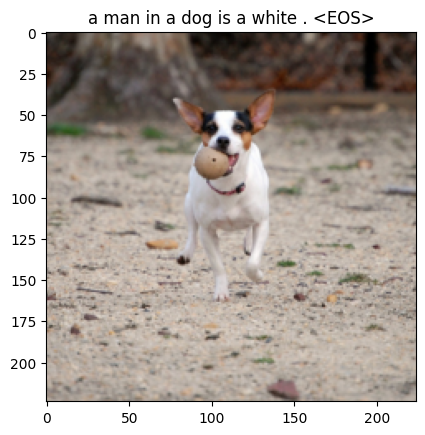

loss =  4.02481


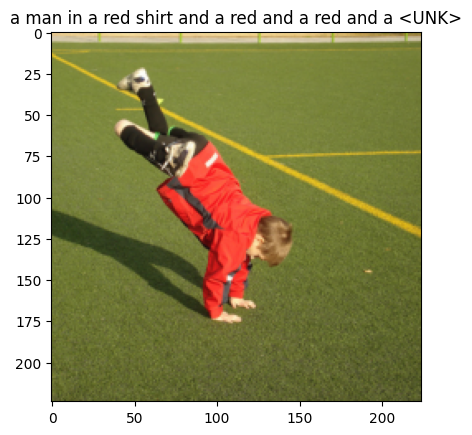

loss =  3.91225


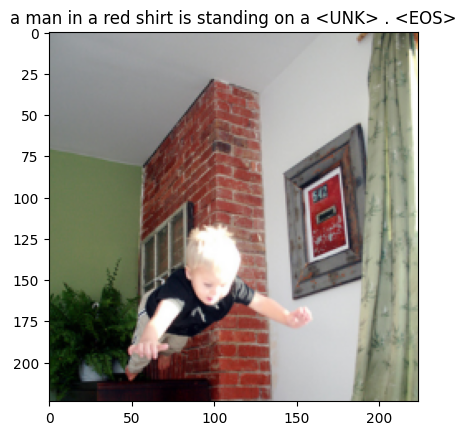

loss =  3.55029


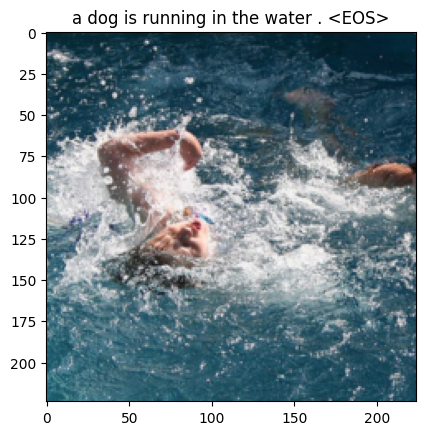

loss =  3.28340


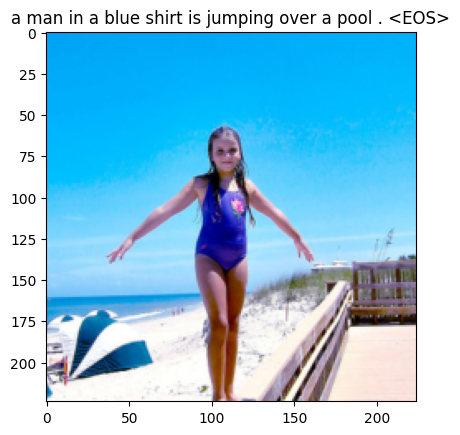

loss =  3.23642


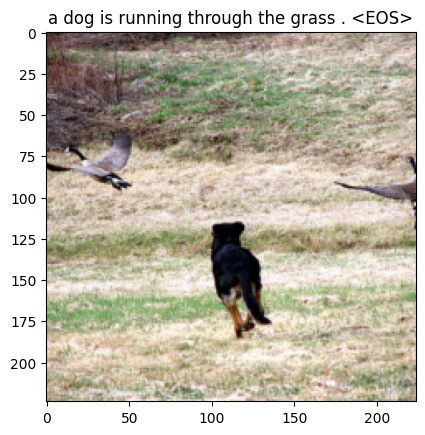

loss =  3.23800


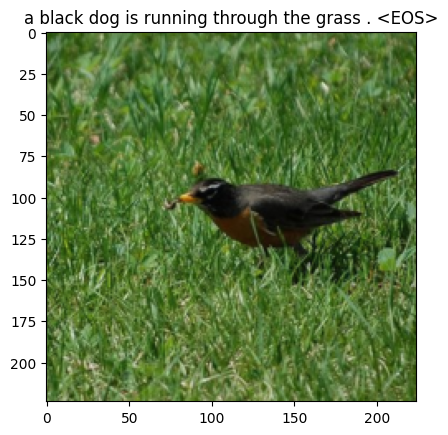

loss =  3.22299


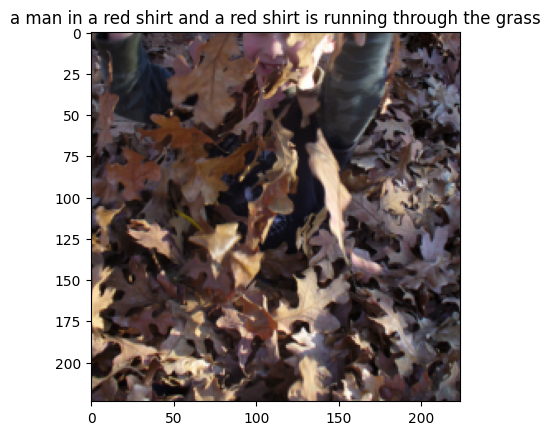

loss =  3.12602


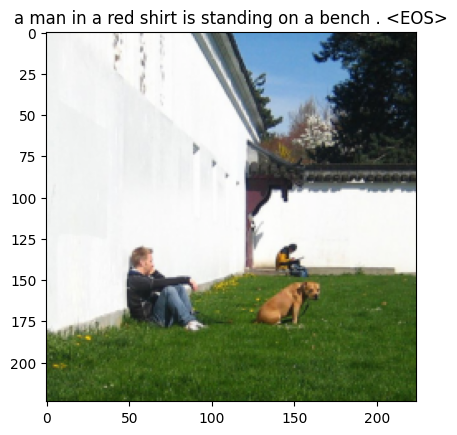

loss =  3.21052


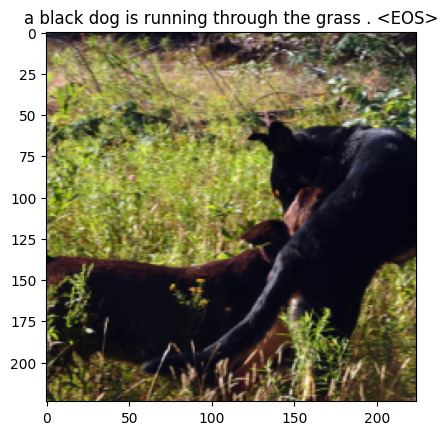

loss =  3.25674


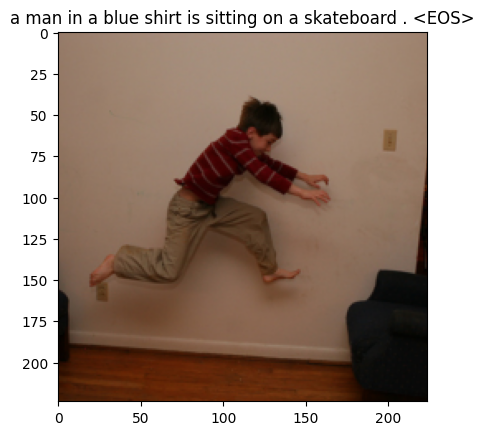

loss =  3.11382


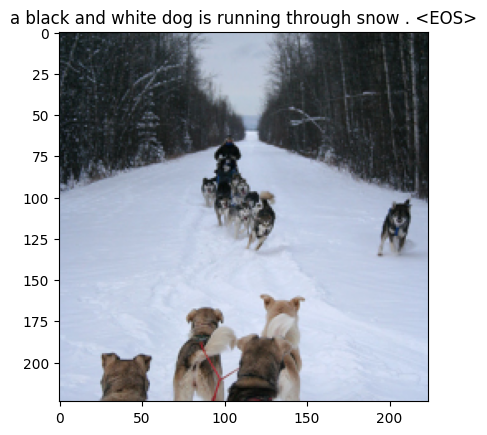

loss =  3.28288


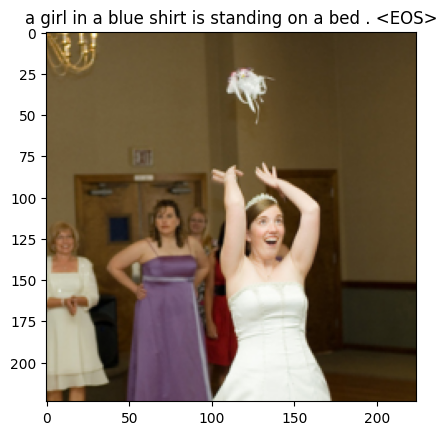

loss =  2.93588


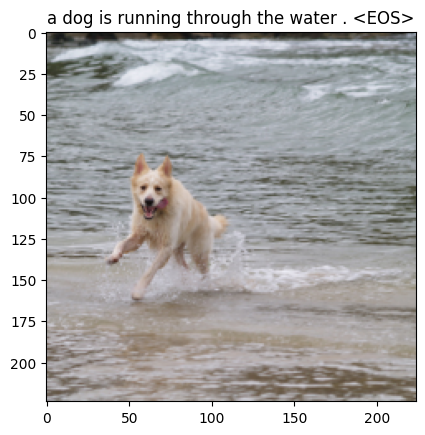

loss =  2.96736


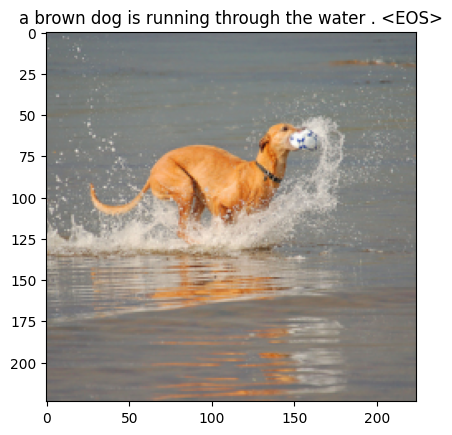

loss =  3.13549


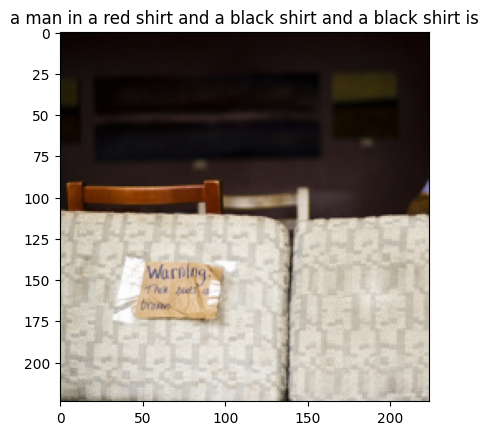

loss =  3.02197


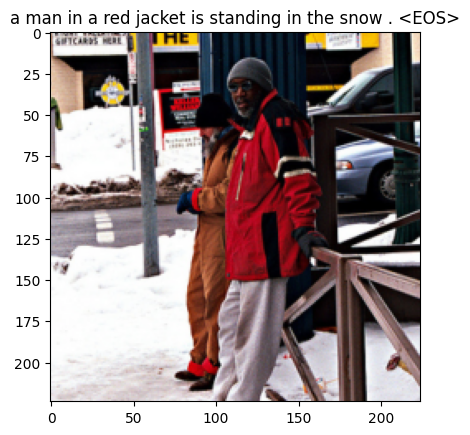

loss =  2.97590


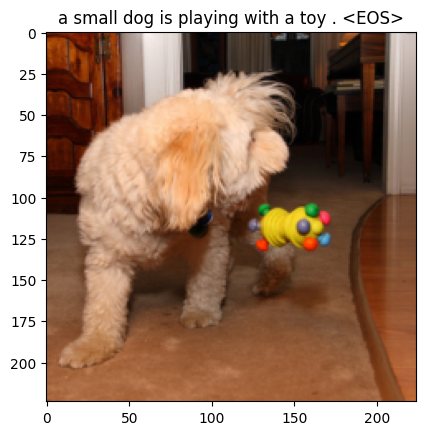

loss =  2.86542


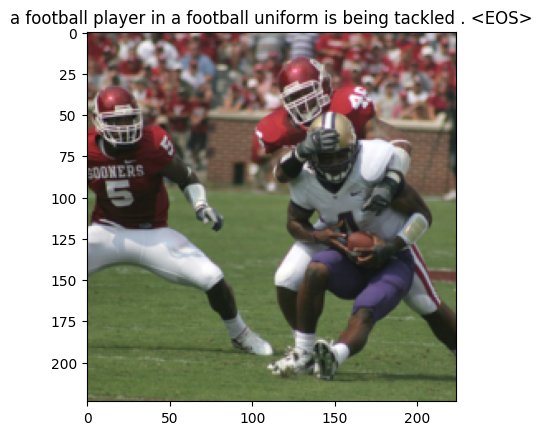

loss =  2.89341


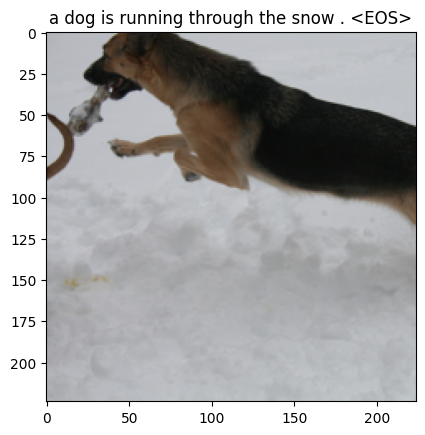

loss =  2.71499


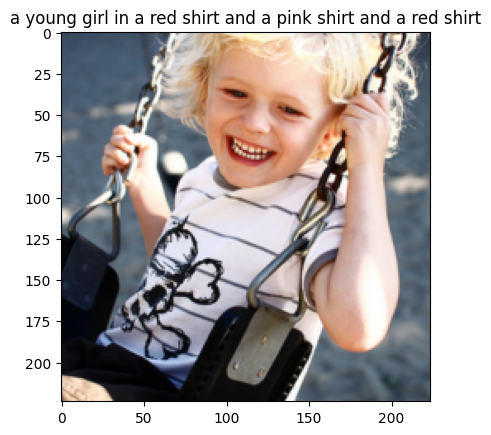

loss =  2.66055


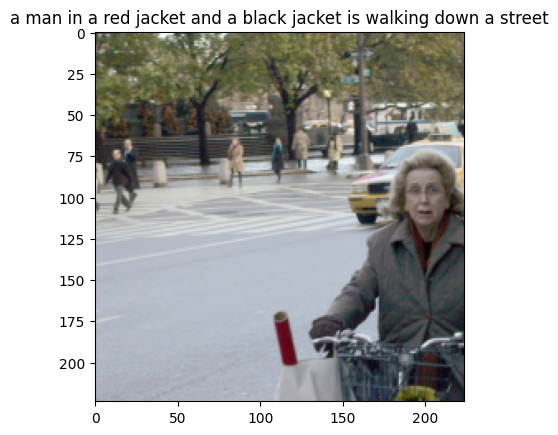

loss =  2.70386


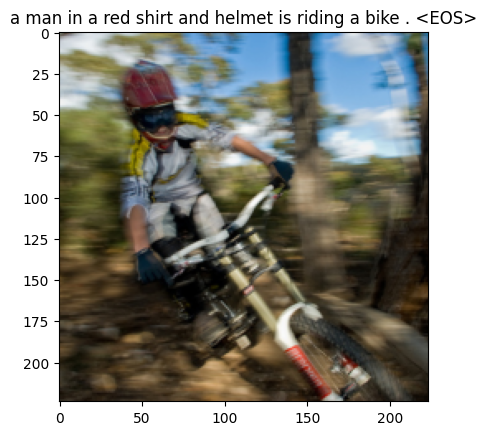

loss =  2.75279


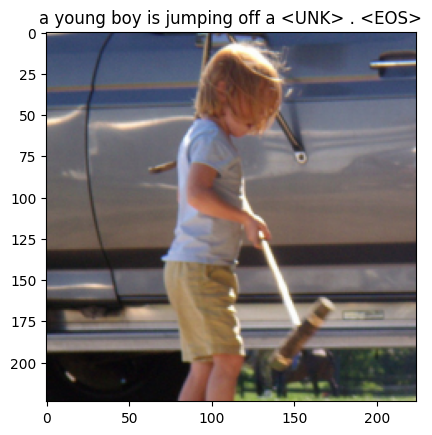

loss =  2.63546


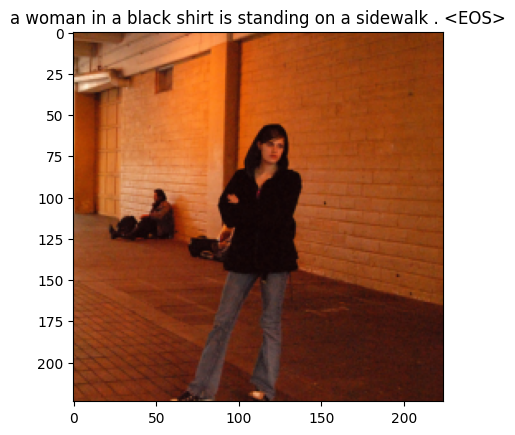

loss =  3.03946


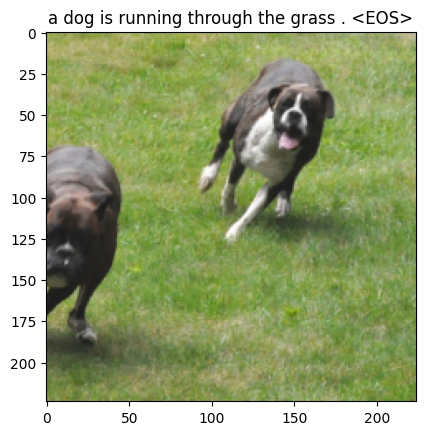

loss =  2.57062


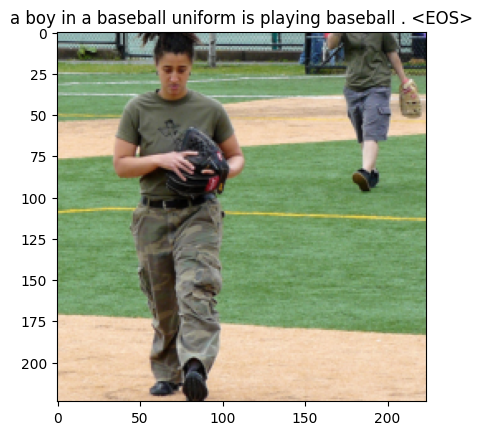

loss =  2.75786


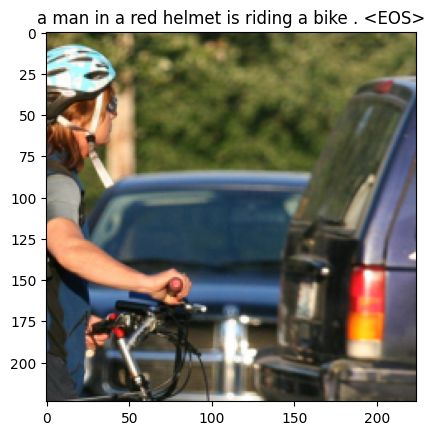

loss =  2.66490


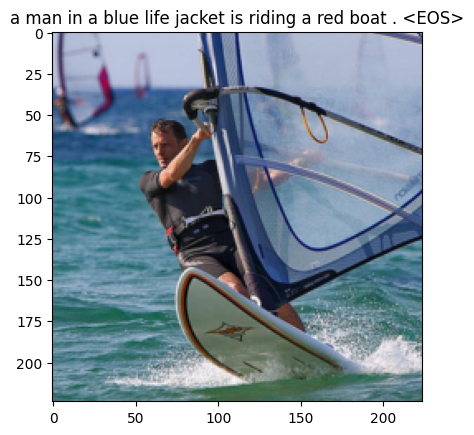

loss =  2.78522


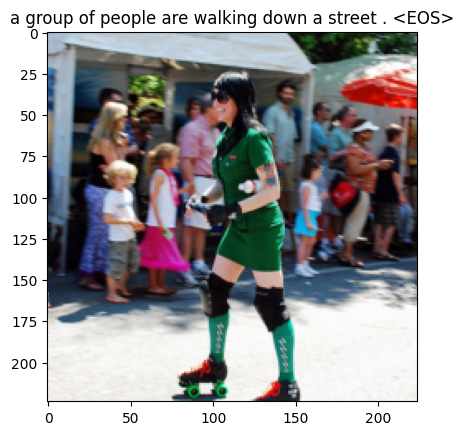

loss =  2.42358


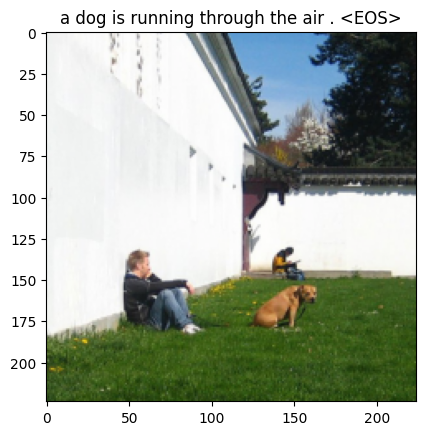

loss =  2.69053


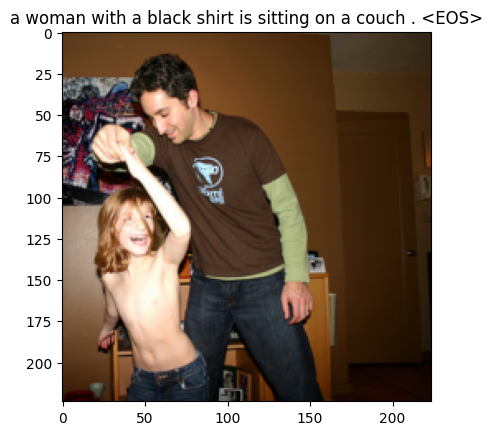

loss =  2.48464


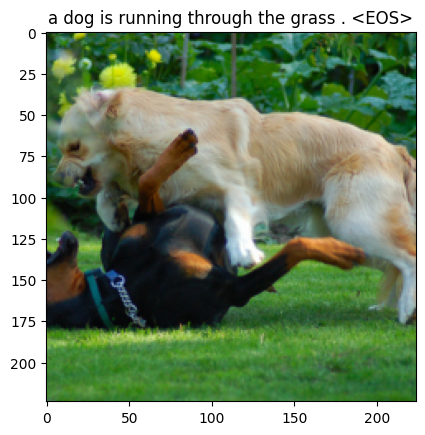

loss =  2.56868


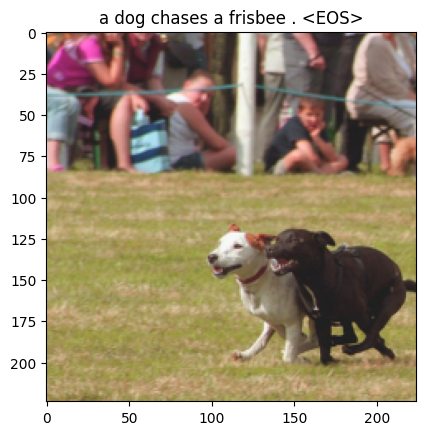

loss =  2.46007


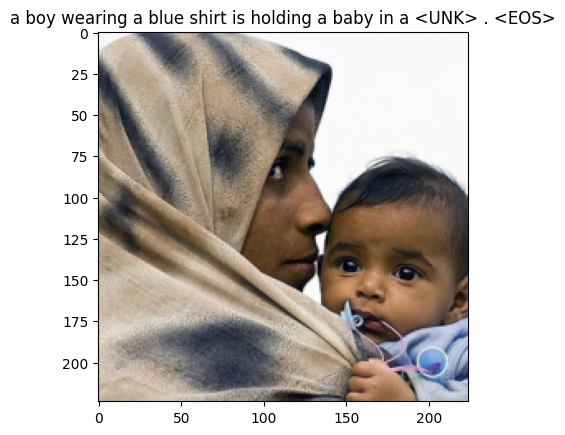

loss =  2.57076


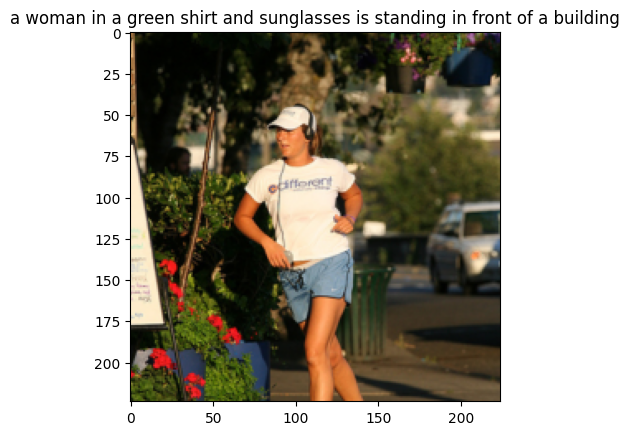

loss =  2.56969


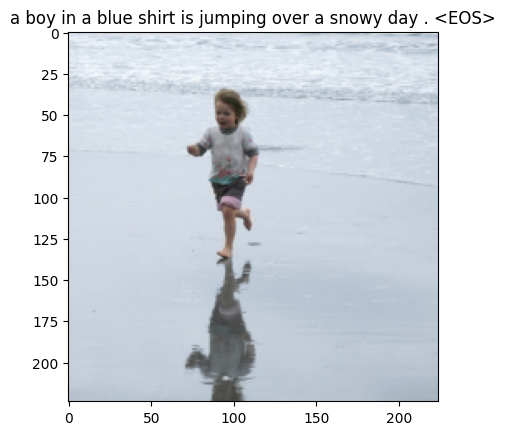

loss =  2.64272


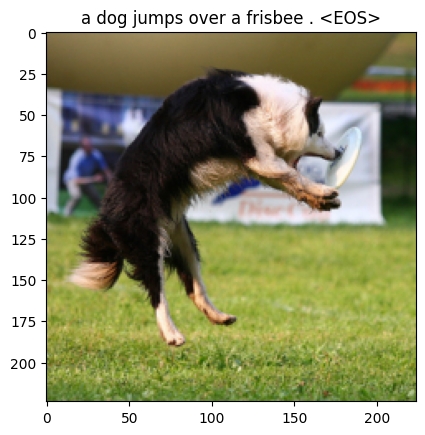

loss =  2.60794


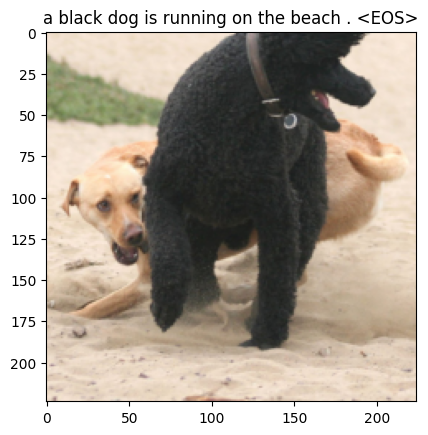

loss =  2.53598


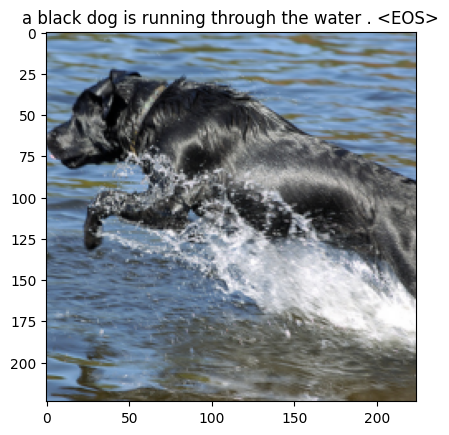

loss =  2.57024


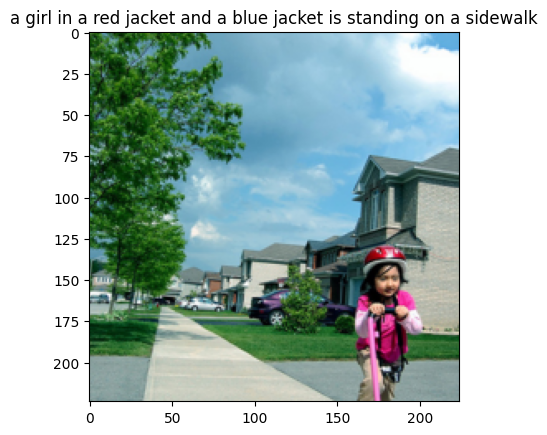

OSError: ignored

In [67]:
num_epochs = 25
print_gap = 100
for epoch in range(1, num_epochs+1):
  for idx, (image, captions) in enumerate(iter(dataloader)):
    image, captions = image.to(device), captions.to(device)
    optimizer.zero_grad()
    output, attention = model(image, captions)
    targets = captions[:, 1:]
    loss = ce_loss(output.view(-1, vocab_size), targets.reshape(-1))
    loss.backward()
    optimizer.step()

    if(idx+1)%print_gap == 0:
      print("loss = {: .5f}".format(loss.item()))

      model.eval()

      with torch.no_grad():
        data_iter = iter(dataloader)
        img, _ = next(data_iter)
        features = model.encoder(img[0:1].to(device))
        caps, alphas = model.decoder.generate_captions(features, vocab=dataset.vocab)
        captions = ' '.join(caps)
        show_image(img[0], title=captions)

      model.train()

  save_model(model, epoch)